In [1]:
import numpy as np
import imageio
import matplotlib.pyplot as plt
import matplotlib as mpl
from skimage import color
import nengo

from PIL import Image

%matplotlib inline
%config InlineBackend.figure_format = 'retina'

#2160p (4K) - 3840 x 2160 pixeles
#1440p (2K) - 2560 x 1440 pixeles
#1080p (HD) - 1920 x 1080 pixeles
#720p (HD) - 1280 x 720 pixeles
#480p - 854 x 480 pixeles
#360p - 640 x 360 pixeles
#240p - 426 x 240 pixeles
#144p – 256 x 144 pixeles


In [2]:
mpl.rcParams['axes.edgecolor'] = 'white' 
mpl.rcParams['axes.labelcolor'] = 'white' 
mpl.rcParams['xtick.color'] = 'white' 
mpl.rcParams['ytick.color'] = 'white' 
mpl.rcParams['text.color'] = 'white' 
mpl.rcParams['axes.facecolor'] = '#111111'
mpl.rcParams['figure.max_open_warning'] = 0

## Loading the images

The set can be changed by selecting a different folder

In [2]:
q0 = imageio.imread('8/19382486-Quadrant_I0.jpg')
q90 = imageio.imread('8/19382486-Quadrant_I90.jpg')
q45 = imageio.imread('8/19382486-Quadrant_I45.jpg')
q135 = imageio.imread('8/19382486-Quadrant_I135.jpg')

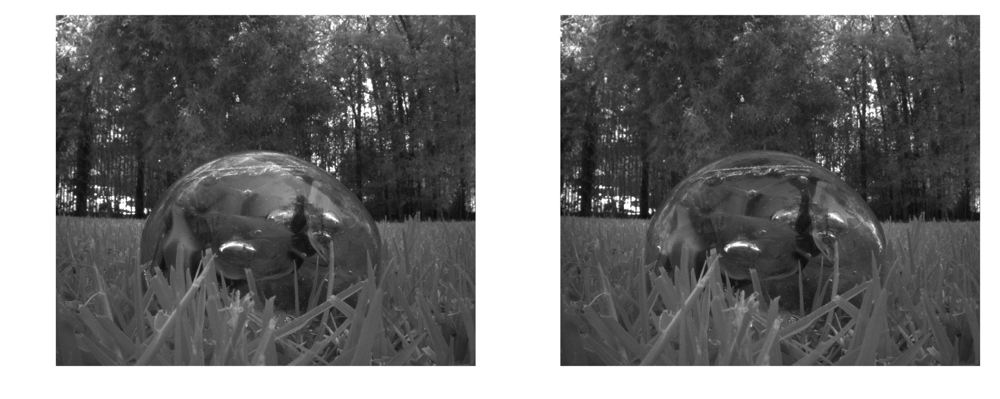

In [4]:
fig, ax = plt.subplots(1,2)
ax[0].imshow(q0, cmap = 'gray',vmin=0, vmax=255)
ax[1].imshow(q90, cmap = 'gray',vmin=0, vmax=255)
fig.set_size_inches(12,6)

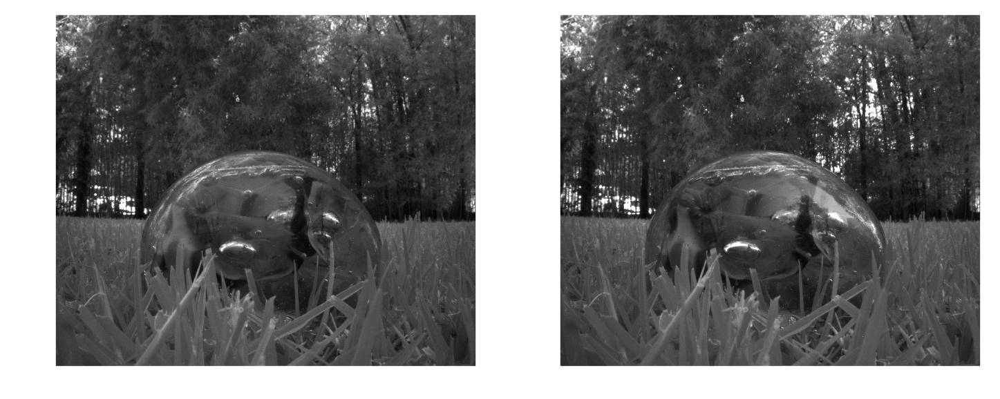

In [5]:
fig, ax = plt.subplots(1,2)
ax[0].imshow(q45, cmap = 'gray')
ax[1].imshow(q135, cmap = 'gray')
fig.set_size_inches(12,6)

## Computing the Stoke's parameters

$$\text{S}_1 = I_0 - I_{90}$$

 $$\text{S}_2 = I_{45} - I_{135}$$

In [6]:
S0 = q0.astype('int8') + q90.astype('int8')

S1 = q0.astype('int8') - q90.astype('int8')

S2 = q45.astype('int8') - q135.astype('int8')

In [7]:
S0

Array([[  50,   37,   22, ..., -114, -108, -104],
       [  44,   37,   31, ..., -117, -113, -109],
       [  32,   34,   41, ..., -107, -105, -102],
       ...,
       [ 103,  115,  125, ...,  115,  115,  119],
       [ 104,  111,  117, ...,  116,  116,  120],
       [ 111,  112,  112, ...,  117,  117,  121]], dtype=int8)

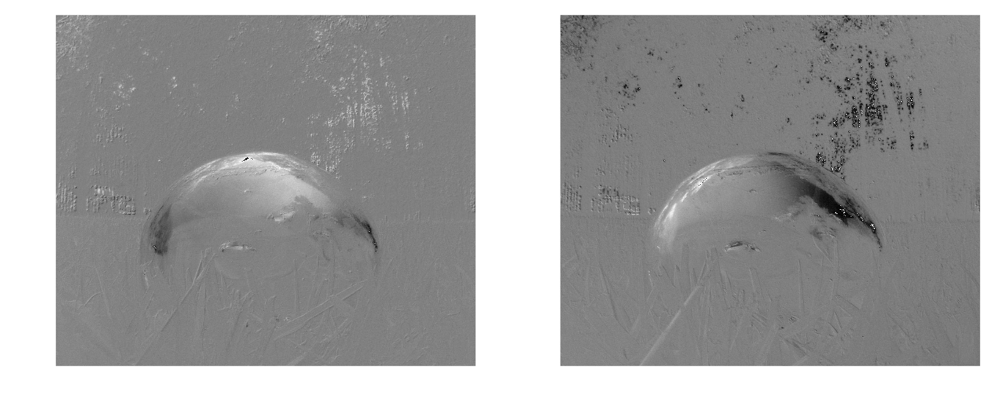

In [8]:
fig, ax = plt.subplots(1,2)
im = ax[0].imshow(S1, cmap = 'gray')
im2 = ax[1].imshow(S2, cmap = 'gray')

fig.set_size_inches(12,6)

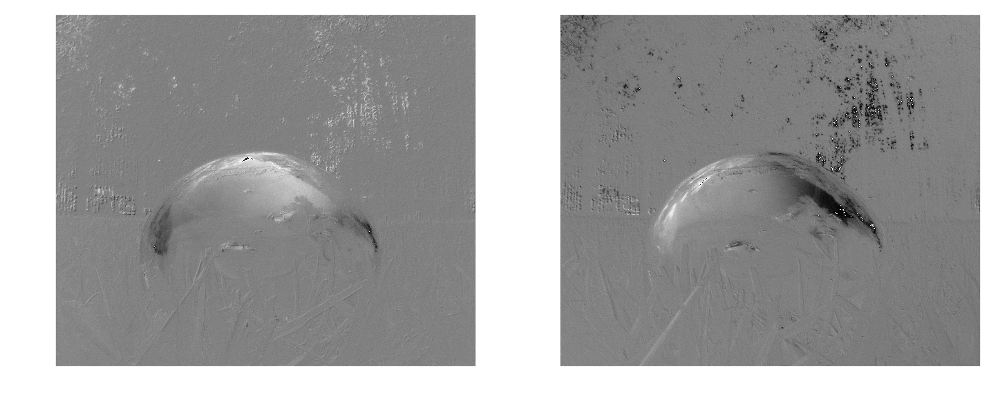

In [9]:
fig, ax = plt.subplots(1,2)
im = ax[0].imshow(S1, cmap = 'gray',vmin=-128, vmax=128)
im2 = ax[1].imshow(S2, cmap = 'gray',vmin=-128, vmax=128)
fig.set_size_inches(12,6)

## Compute the simple linear combination of signal and map them to color and luminance channels

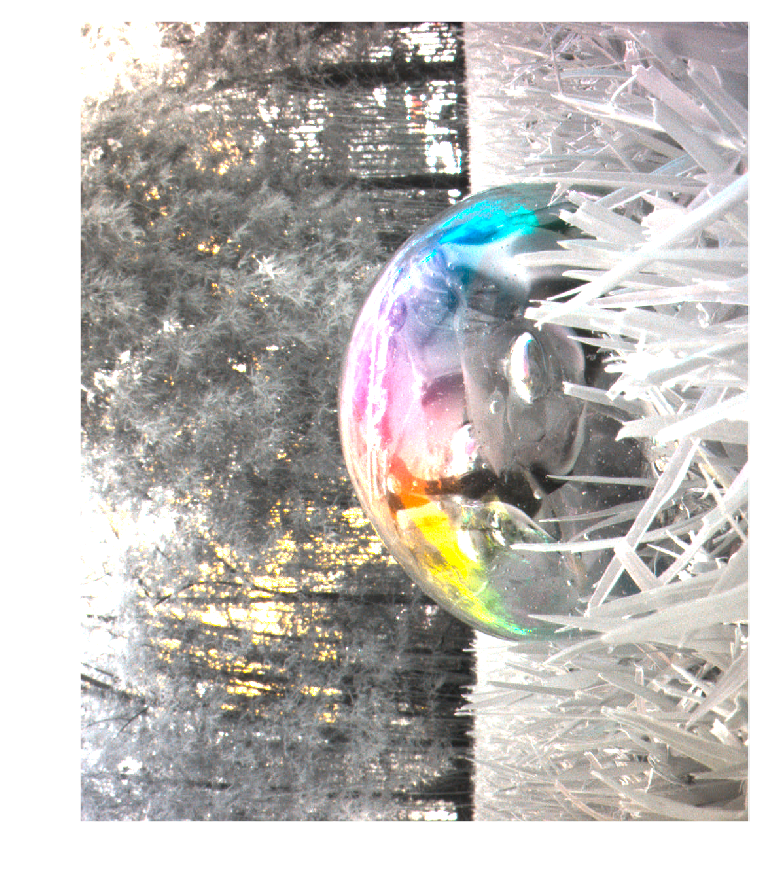

In [10]:
flab = np.array([(q0.astype(float)+q90.astype(float))/2,q0.astype(float)-q90.astype(float),q135.astype(float)-q45.astype(float)])
fig, ax = plt.subplots()
fig.set_size_inches(6,8)
ax.imshow(color.lab2rgb(flab.swapaxes(0,2)))
fig.savefig('esfera_simple.png')

## Trying more complex computations

In [11]:
surr = 3
start = surr
sy = q0.shape[0] - surr * 2
sx = q0.shape[1] - surr * 2
ret = np.zeros((sy,sx))
for i in range(sy):
    for j in range(sx):
        ret[i,j] = q0[i+start,j+start].astype(float) - np.mean(q90[i+start-surr:i+start+surr,j+start-surr:j+start+surr].astype(float))
        

In [12]:
surr = 3
start = surr
sy = q0.shape[0] - surr * 2
sx = q0.shape[1] - surr * 2
ret2 = np.zeros((sy,sx))
for i in range(sy):
    for j in range(sx):
        ret2[i,j] = q135[i+start,j+start].astype(float) - np.mean(q45[i+start-surr:i+start+surr,j+start-surr:j+start+surr].astype(float))

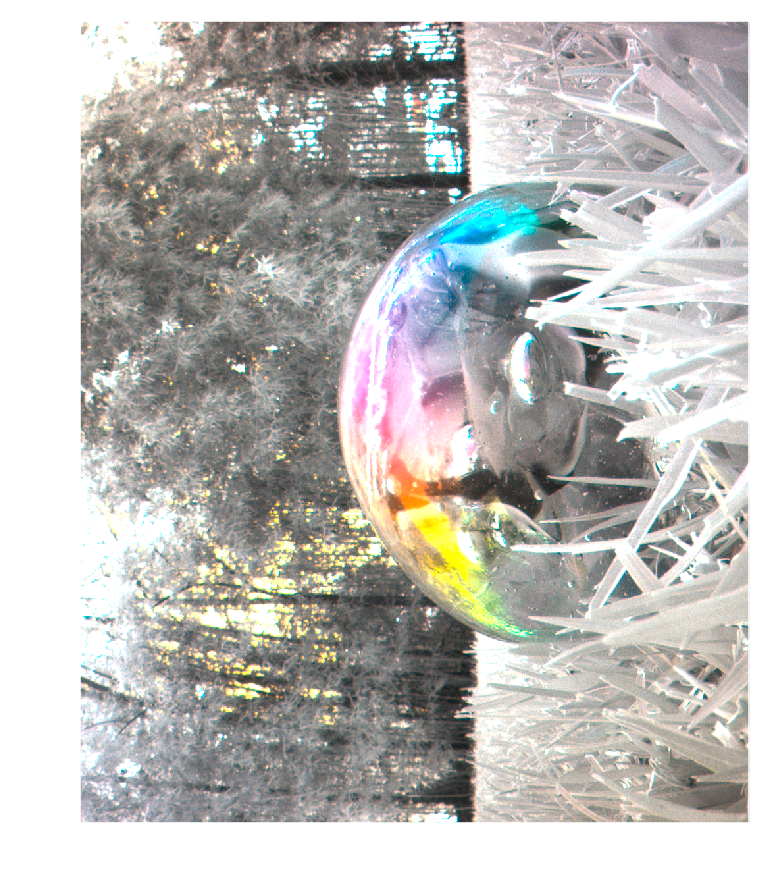

In [13]:
lab = np.array([(q0[surr:sy+surr,surr:sx+surr].astype(float)+q90[surr:sy+surr,surr:sx+surr].astype(float))/2, ret, ret2])
ims = color.lab2rgb(lab.swapaxes(0,2))
fig, ax = plt.subplots()
fig.set_size_inches(6,8)
ax.imshow(ims)
fig.savefig('moto_surround.png')

In [14]:
slab = np.array([(q0.astype(float)+q90.astype(float)+q135.astype(float)+q45.astype(float))/4,(q0.astype(float)-q90.astype(float))/(q0.astype(float)+q90.astype(float)),(q135.astype(float)-q45.astype(float))/(q135.astype(float)+q45.astype(float))])

In [15]:
loglab = np.array([(q0.astype(float)+q90.astype(float))/2,np.log(q0.astype(float)/q90.astype(float)),np.log(q135.astype(float)/q45.astype(float))])

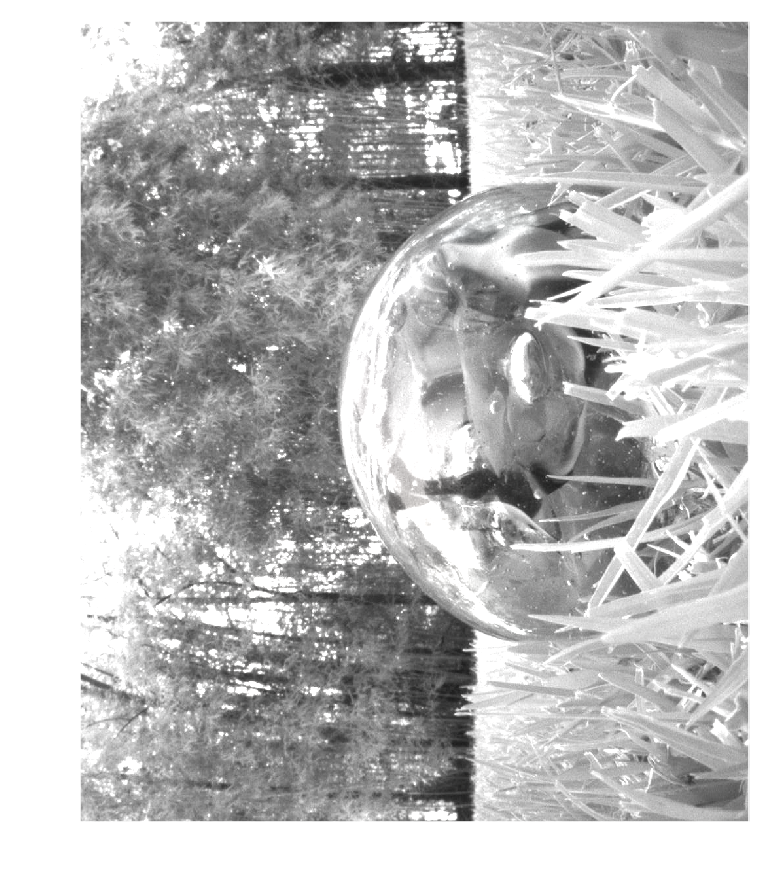

In [16]:
fig, ax = plt.subplots()
fig.set_size_inches(6,8)
ax.imshow(color.lab2rgb(loglab.swapaxes(0,2)))
#fig.savefig('moto_log.png')

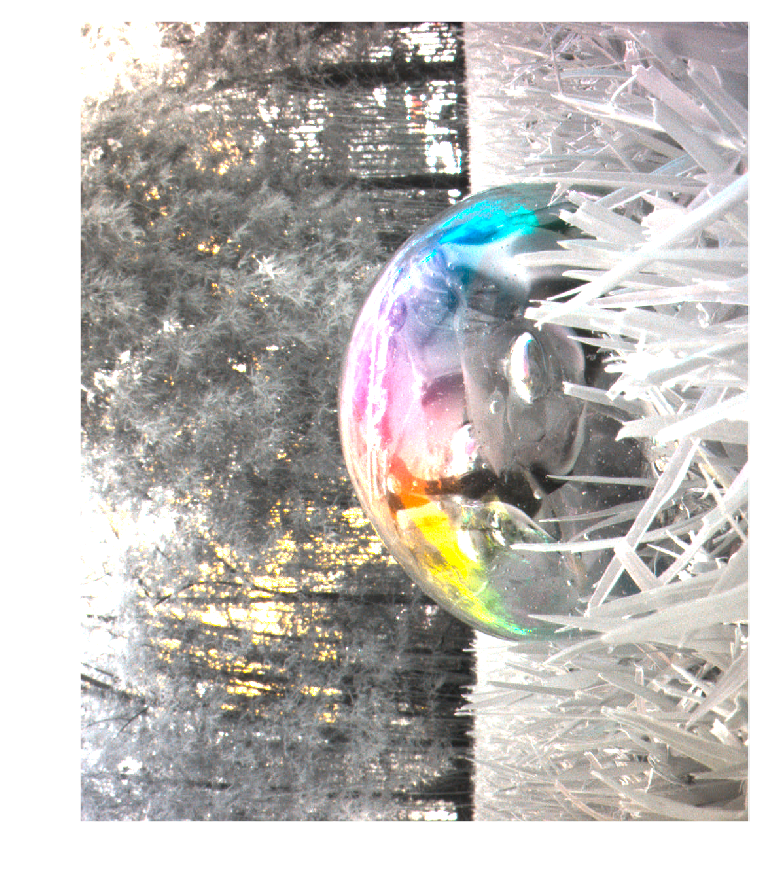

In [17]:
L = q0.astype(float) + q90.astype(float)

v = q0.astype(float) - (q45.astype(float) * .5 + q135 * .5)
h = q90.astype(float) - (q45.astype(float) * .5 + q135 * .5)
d = q135.astype(float) - (q0.astype(float) * .5 + q90 * .5)
a = q45.astype(float) - (q0.astype(float) * .5 + q90 * .5)
A = v - h
B = d - a
suplab = np.array([L/2,A,B])
fig, ax = plt.subplots()
fig.set_size_inches(6,8)
ax.imshow(color.lab2rgb(suplab.swapaxes(0,2)))
#fig.savefig('moto_supr.png')

In [18]:
S0 = q0.astype('int8') + q90.astype('int8')

(47, 55) 2585 px
18 205
17 186
18 188
18 214


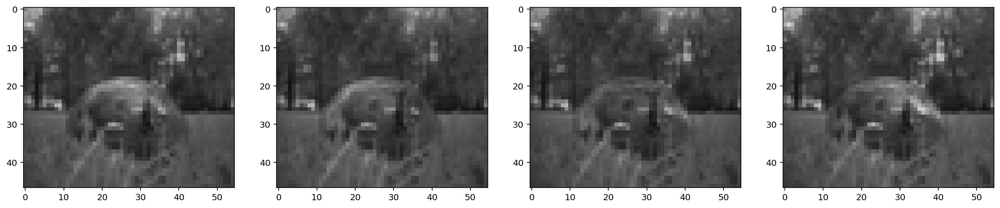

In [35]:
from PIL import Image
import numpy as np


def read_img(img,n):
    temp = Image.open(img)
    x,y=temp.size
    size=[x/n,y/n]
    temp.thumbnail(size)
    temp_1 = np.asarray(temp)
    #im = Image.fromarray(a)
    return (temp_1)

def plot_q():
    fig, ax = plt.subplots(1,4)
    ax[0].imshow(q_0, cmap = 'gray',vmin=0, vmax=255)
    ax[1].imshow(q_45, cmap = 'gray',vmin=0, vmax=255)
    ax[2].imshow(q_90, cmap = 'gray',vmin=0, vmax=255)
    ax[3].imshow(q_135, cmap = 'gray',vmin=0, vmax=255)
    fig.set_size_inches(20,10)

    
def plot_show(a,b,c):
    fig, ax = plt.subplots(1,3)
    ax[0].imshow(a, cmap = 'gray',vmin=0, vmax=255)
    ax[1].imshow(b, cmap = 'gray',vmin=0, vmax=255)
    ax[2].imshow(c, cmap = 'gray',vmin=0, vmax=255)
    fig.set_size_inches(20,10)
    print(a.min(),a.max())
    print(b.min(),b.max())
    print(c.min(),c.max())


type_img='int16'

n=22 #tamaño de resolucion img/n

q_0=read_img('8/19382486-Quadrant_I0.jpg',n)
q_45=read_img('8/19382486-Quadrant_I45.jpg',n)
q_90=read_img('8/19382486-Quadrant_I90.jpg',n)
q_135=read_img('8/19382486-Quadrant_I135.jpg',n)

plot_q()

print(q_0.shape,q_0.size,'px')

print(q_0.min(),q_0.max())
print(q_45.min(),q_45.max())
print(q_90.min(),q_90.max())
print(q_135.min(),q_135.max())

7 250
6 248
13 498


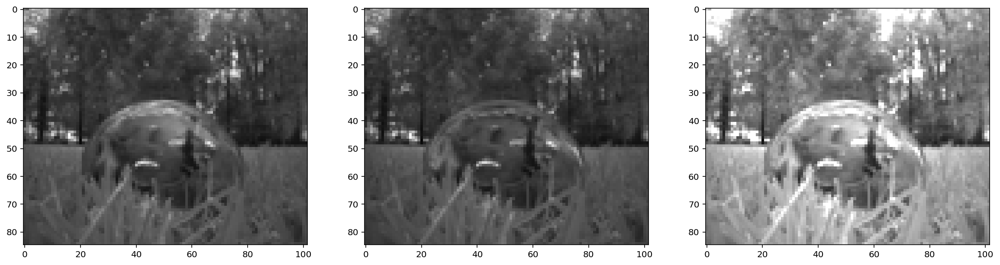

In [23]:
S_0= q_0.astype(type_img) + q_90.astype(type_img)
plot_show(q_0,q_90,S_0)


7 250
6 248
-71 107


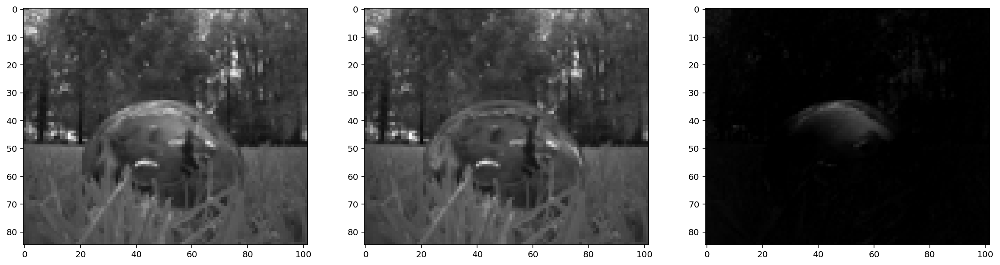

In [24]:
S_1= q_0.astype(type_img) - q_90.astype(type_img)
plot_show(q_0,q_90,S_1)

7 249
7 254
-127 94


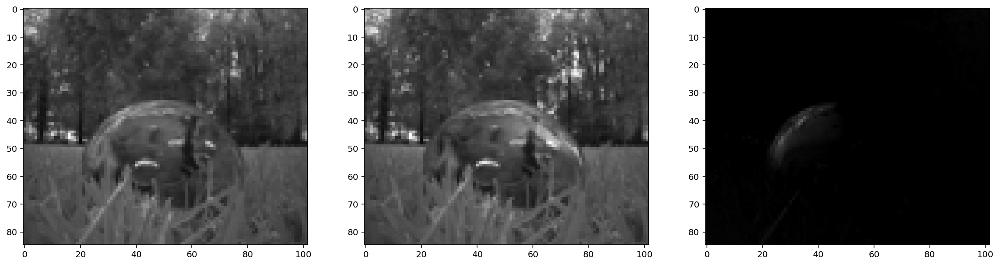

In [25]:
S_2= q_45.astype(type_img) - q_135.astype(type_img)
plot_show(q_45,q_135,S_2)

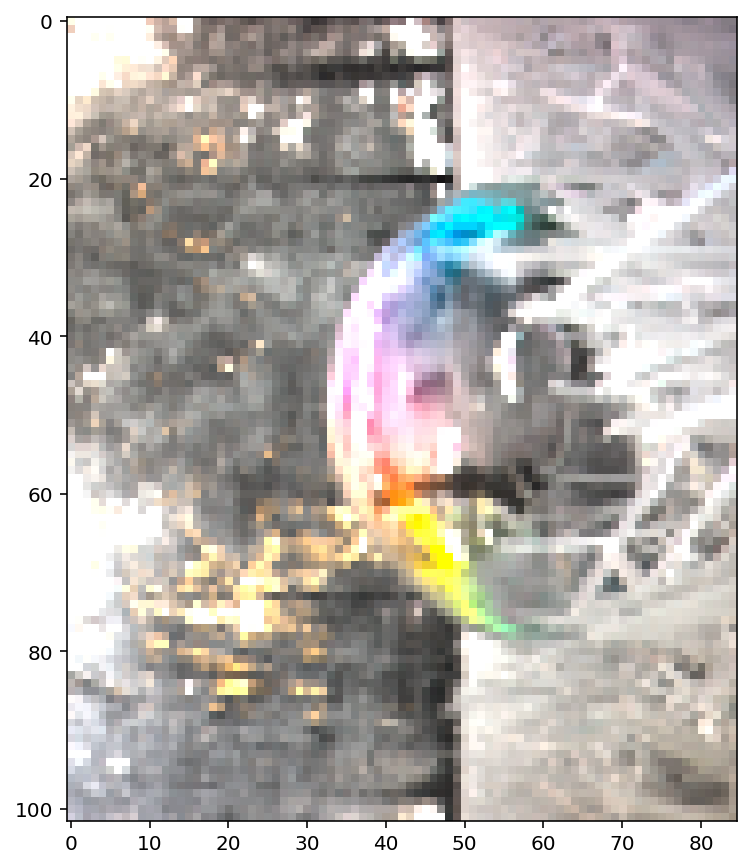

In [26]:
flab = np.array([(q_0.astype(float)+q_90.astype(float))/2 , q_0.astype(float)-q_90.astype(float) , q_135.astype(float)-q_45.astype(float)])
fig, ax = plt.subplots()
fig.set_size_inches(6,8)
ax.imshow(color.lab2rgb(flab.swapaxes(0,2)))
fig.savefig('esfera_simple.png')

In [163]:
import nengo


class MyClass:
    def __init__(self, name):
        self.name = name


model = nengo.Network(label='q_0')
#q_0
NeuronaL = {}
with model:
    for i in range(0,q_0.shape[0]):
        name = i
        NeuronaL[name] = NeuronaL.get(name, MyClass(name = name))
        NeuronaL[name] = nengo.Ensemble(1, dimensions=q_0.shape[1])
        input = nengo.Node(output=q_0.tolist()[name])  
        nengo.Connection(input, NeuronaL[name]) 
sim = nengo.Simulator(model)
sim.run(1.)

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc.set('progress', 'progress_bar', 'nengo.utils.progress.TerminalProgressBar')`.

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc.set('progress', 'progress_bar', 'nengo.utils.progress.TerminalProgressBar')`.

In [169]:
sim.data

{<Ensemble (unlabeled) at 0x212c540c908>: BuiltEnsemble(eval_points=array([[-0.0010497 , -0.09556032,  0.01084984, ...,  0.15247642,
        -0.2003216 ,  0.26224307],
       [ 0.13407783,  0.06114356,  0.01036201, ..., -0.14893895,
        -0.08005763,  0.27684345],
       [ 0.3214747 ,  0.01432332, -0.03075583, ..., -0.04190907,
         0.12304071, -0.00602701],
       ...,
       [-0.00356909, -0.0629242 ,  0.01101499, ...,  0.05405005,
        -0.07333431, -0.0854355 ],
       [ 0.1176434 ,  0.06796063, -0.03395282, ..., -0.11074838,
        -0.07628832,  0.17082893],
       [-0.01854067, -0.09948886,  0.11569358, ..., -0.11949982,
        -0.0204968 , -0.06445728]]), encoders=array([[-0.02103558,  0.05256445, -0.06493971, -0.19705663, -0.05190115,
        -0.03680011, -0.00383512, -0.00196917, -0.15107839,  0.17113986,
        -0.15432519,  0.23194987, -0.15772132, -0.06741632, -0.01710798,
        -0.1089792 ,  0.10602364, -0.00940311, -0.09872983,  0.09970115,
         0.023674

In [129]:
# Setup the environment
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline

import nengo
from nengo.utils.matplotlib import rasterplot

In [130]:
model = nengo.Network(label='A Single Neuron')
with model:
    # Input
    cos = nengo.Node(output=(0.5))
   
    # Ensemble with one neuron
    neuron = nengo.Ensemble(1, dimensions=1,  # Represent a scalar
                            encoders=[[1]])   # Sets the neurons firing rate to increase for positive input
    
    # Connecting input to ensemble
    nengo.Connection(cos, neuron)

In [131]:
sim = nengo.Simulator(model)

sim.run(1)

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc.set('progress', 'progress_bar', 'nengo.utils.progress.TerminalProgressBar')`.

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc.set('progress', 'progress_bar', 'nengo.utils.progress.TerminalProgressBar')`.

In [133]:
sim.data

{<Ensemble (unlabeled) at 0x212c25f5408>: BuiltEnsemble(eval_points=array([[ 0.08430161],
       [ 0.97351492],
       [-0.68573446],
       [-0.16508041],
       [ 0.1502465 ],
       [ 0.28777313],
       [-0.84320127],
       [ 0.70979679],
       [ 0.03464784],
       [-0.6565224 ],
       [-0.78720873],
       [ 0.46214361],
       [-0.76032934],
       [ 0.44667908],
       [-0.7736962 ],
       [ 0.63029507],
       [ 0.61563601],
       [ 0.13943801],
       [-0.88117334],
       [ 0.05434184],
       [-0.93772591],
       [ 0.07050986],
       [ 0.29097004],
       [ 0.63561009],
       [ 0.29344305],
       [ 0.62880192],
       [-0.70300729],
       [-0.00814728],
       [ 0.56366481],
       [ 0.2527835 ],
       [-0.77632353],
       [ 0.48010132],
       [-0.56285141],
       [-0.48242466],
       [ 0.764389  ],
       [-0.5987722 ],
       [ 0.48753148],
       [-0.44137568],
       [-0.42267766],
       [ 0.02759524],
       [ 0.85220224],
       [-0.73262254],
       [

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc.set('progress', 'progress_bar', 'nengo.utils.progress.TerminalProgressBar')`.

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc.set('progress', 'progress_bar', 'nengo.utils.progress.TerminalProgressBar')`.

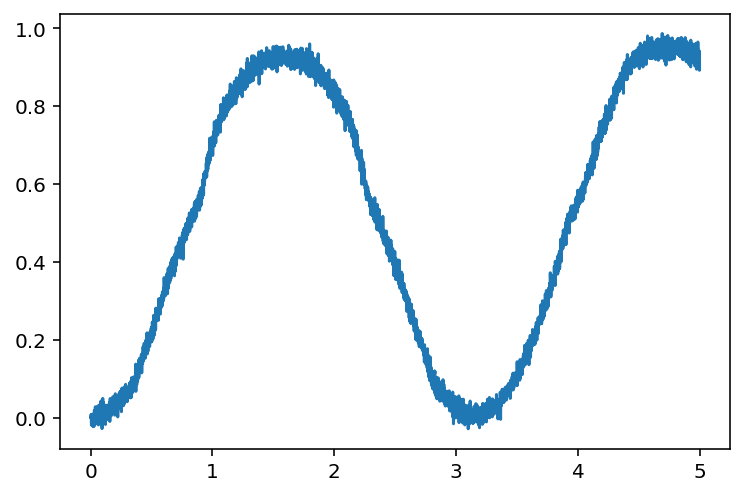

In [149]:
import nengo
import numpy as np
import matplotlib.pyplot as plt

with nengo.Network() as net:
    sin_input = nengo.Node(output=np.sin)
    # A population of 100 neurons representing a sine wave
    sin_ens = nengo.Ensemble(n_neurons=100, dimensions=1)
    nengo.Connection(sin_input, sin_ens)
    # A population of 100 neurons representing the square of the sine wave
    sin_squared = nengo.Ensemble(n_neurons=100, dimensions=1)
    nengo.Connection(sin_ens, sin_squared, function=np.square)
    # View the decoded output of sin_squared
    squared_probe = nengo.Probe(sin_squared, synapse=0.01)

with nengo.Simulator(net) as sim:
    sim.run(5.0)
plt.plot(sim.trange(), sim.data[squared_probe])

In [152]:
np.zeros([47,55])

array([[0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.]])

In [160]:
sim.trange

<bound method Simulator.trange of <nengo.simulator.Simulator object at 0x00000212C2982D88>>